In [ ]:
!pip install tensorboard

In [ ]:
# Import necessary library
import sys
import numpy as np
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from tensorflow.python.client import device_lib
from tensorflow.keras import layers, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

# For reproducibility of NumPy, and Tensorflow random operations
SEED=42
np.random.seed(SEED)
tf.random.set_seed(SEED)

# Load the TensorBoard extension for visualization
%load_ext tensorboard

In [ ]:
# Print Python and TensorFlow versions
print("Python Version:", sys.version_info)
print("TensorFlow Version:", tf.__version__)

# List available physical devices
print("\nAvailable Physical Devices:")
for device in tf.config.list_physical_devices():
    print(device)

# List local devices (with more detailed info like device name/type)
print("\nLocal Devices Info:")
devices = device_lib.list_local_devices()
for device in devices:
    print(f"{device.device_type}: {device.name} - {device.physical_device_desc}")

Python Version: sys.version_info(major=3, minor=11, micro=12, releaselevel='final', serial=0)
TensorFlow Version: 2.18.0

Available Physical Devices:
PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')

Local Devices Info:
CPU: /device:CPU:0 - 
GPU: /device:GPU:0 - device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5


In [ ]:
# Import necessary library
import shutil
import os

# Copy file using Shutil
def safe_copy_file(src_path, dst_dir):
    """
    Copy a file safely using shutil.
    If the destination directory doesn't exist, it will be created.
    The file will be copied with its original name.
    """
    if not os.path.exists(src_path):
        print(f"Source file does not exist: {src_path}")
        return

    os.makedirs(dst_dir, exist_ok=True)

    # Keep original file name
    filename = os.path.basename(src_path)
    dst_path = os.path.join(dst_dir, filename)

    try:
        shutil.copy(src_path, dst_path)
        print(f"File copied successfully: {dst_path}")
    except Exception as e:
        print(f"Error copying file: {e}")

# Copy folder using copytree
def safe_copy_folder(src_folder, dst_folder, dirs_exist=False):
    if not os.path.exists(src_folder):
        print(f"Source folder does not exist: {src_folder}")
        return

    try:
        shutil.copytree(src_folder, dst_folder, dirs_exist_ok=dirs_exist)
        print(f"Folder copied successfully: {dst_folder}")
    except FileExistsError:
        print(f"Destination folder already exists: {dst_folder}")
    except Exception as e:
        print(f"Error copying folder: {e}")

In [ ]:
# Import necessary library
from google.colab import drive
import zipfile

# Mount drive
drive.mount('/content/drive')

# Directory of source and destination
src = '/content/drive/MyDrive/eye_diseases_classification.zip'
dst = '/content'

safe_copy_file(src, dst)

# Unzip file
with zipfile.ZipFile("/content/eye_diseases_classification.zip", 'r') as zip_ref:
    zip_ref.extractall("/content/eye_diseases_classification")

Mounted at /content/drive
File copied successfully: /content/eye_diseases_classification.zip


### **Preprocessing Dataset**

In [ ]:
dataset_path = '/content/eye_diseases_classification/dataset'
img_size = (224, 224)
batch_size = 32

# Load dataset, and split it to training and validation datasets
train_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=img_size,
    batch_size=batch_size,
    label_mode="categorical"
)

val_ds = tf.keras.utils.image_dataset_from_directory(
    dataset_path,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=img_size,
    batch_size=batch_size,
    label_mode="categorical"
)

# Store class names before prefetching
class_names = train_ds.class_names  # Capture class names here
num_classes = len(train_ds.class_names)

# Optimize with prefetching
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000, seed=SEED).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

Found 4217 files belonging to 4 classes.
Using 3374 files for training.
Found 4217 files belonging to 4 classes.
Using 843 files for validation.


### **Dataset Information**

Dataset Distribution:
Total Training samples: 3374
Total Validation samples: 843



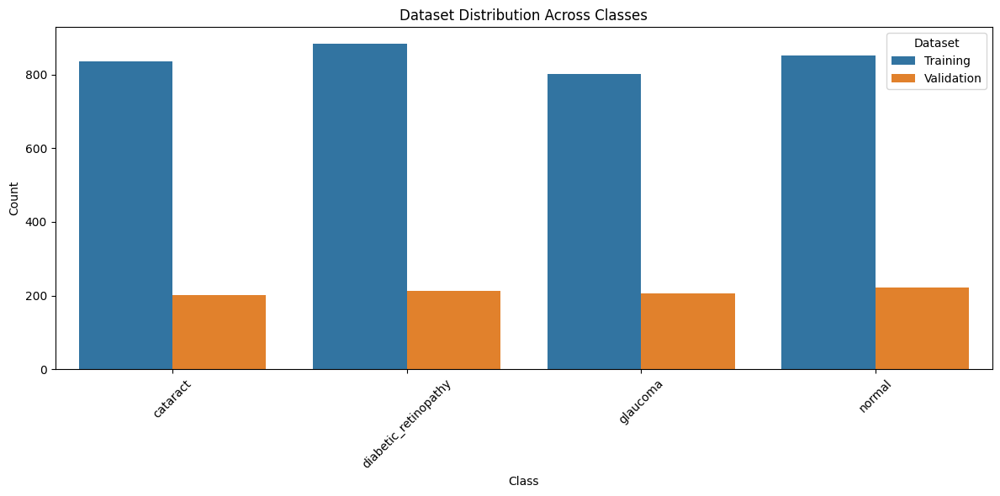


Class-wise Distribution:
               Class  Training  Validation
            cataract       836         202
diabetic_retinopathy       884         214
            glaucoma       802         205
              normal       852         222


In [ ]:
# Count samples per class for each dataset using TensorFlow operations for efficiency.
def count_samples(dataset):
    counts = tf.zeros(len(class_names), dtype=tf.int64)
    for _, labels in dataset:
        indices = tf.argmax(labels, axis=1)
        updates = tf.ones_like(indices, dtype=tf.int64)
        counts = tf.tensor_scatter_nd_add(counts, tf.expand_dims(indices, 1), updates)
    return counts.numpy()

train_counts = count_samples(train_ds)
valid_counts = count_samples(val_ds)

# Create DataFrame for visualization
df = pd.DataFrame({
    'Class': class_names,
    'Training': train_counts,
    'Validation': valid_counts
})

# Print total counts
print("Dataset Distribution:")
print(f"Total Training samples: {sum(train_counts)}")
print(f"Total Validation samples: {sum(valid_counts)}\n")

# Create visualization
plt.figure(figsize=(12, 6))
df_melted = df.melt(id_vars=['Class'], var_name='Dataset', value_name='Count')
sns.barplot(data=df_melted, x='Class', y='Count', hue='Dataset')
plt.title('Dataset Distribution Across Classes')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Display class-wise distribution
print("\nClass-wise Distribution:")
print(df.to_string(index=False))

In [ ]:
for images, labels in val_ds.take(1):
    print("Labels shape:", labels.shape)
    print("Labels example:", labels[0].numpy())

print(f"\nNumber of classes: {num_classes}")
print(f"Class names: {class_names}\n")

print(f"information of train dataset:\n{train_ds.element_spec}")
print(f"information of validation dataset:\n{val_ds.element_spec}")

Labels shape: (32, 4)
Labels example: [0. 0. 0. 1.]

Number of classes: 4
Class names: ['cataract', 'diabetic_retinopathy', 'glaucoma', 'normal']

information of train dataset:
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.float32, name=None))
information of validation dataset:
(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 4), dtype=tf.float32, name=None))


Image shape: (224, 224, 3)
Label shape: (4,)
Image data type: <dtype: 'float32'>


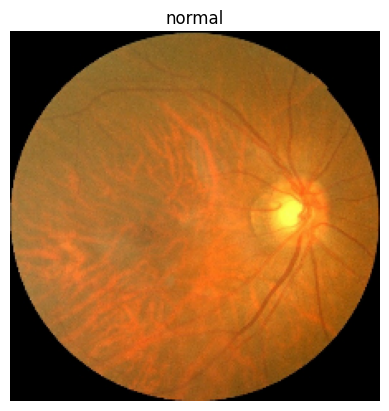

In [ ]:
# Get an image and its label from the dataset
image_batch, label_batch = next(iter(train_ds))  # gets a batch
image = image_batch[0]
label = label_batch[0]

print(f"Image shape: {image.shape}")
print(f"Label shape: {label.shape}")
print(f"Image data type: {image.dtype}")

# Plot
plt.imshow(image.numpy().astype("uint8"))
# Convert label to a single index before using it to access class_names
predicted_class_index = np.argmax(label.numpy()) # get the index of the predicted class
plt.title(class_names[predicted_class_index]) # use the index to access class_names
plt.axis('off')
plt.show()

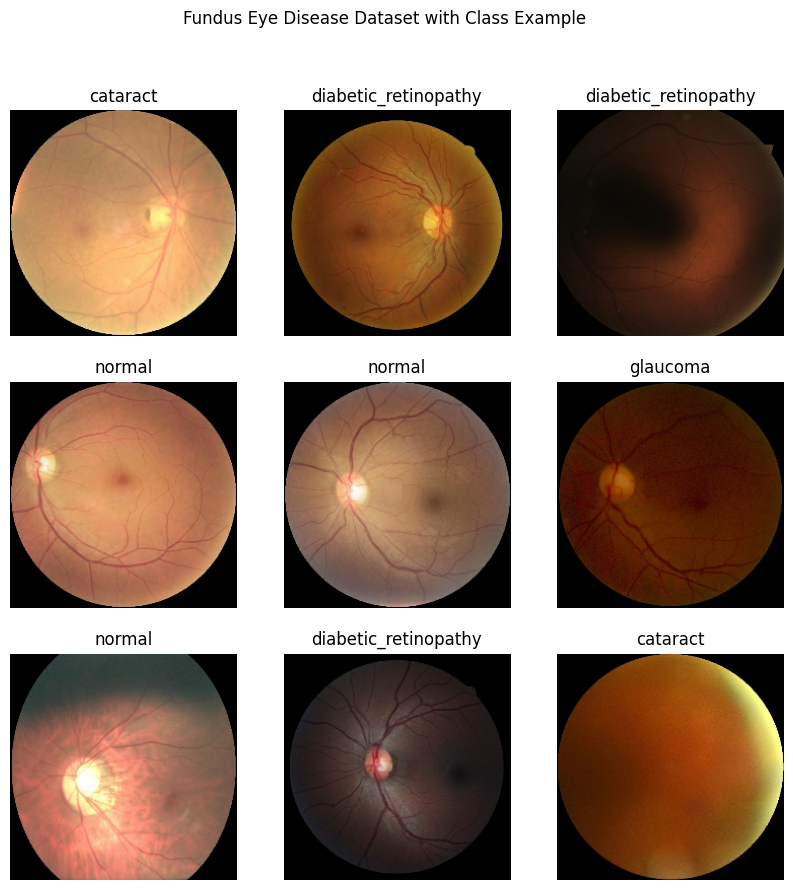

In [ ]:
# Visualize several data from dataset
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.suptitle('Fundus Eye Disease Dataset with Class Example')
        plt.imshow(images[i].numpy().astype("uint8"))
        # Get the index of the true class from the one-hot encoded label
        label_index = np.argmax(labels[i].numpy())
        plt.title(class_names[label_index])  # Use label_index to access class_names
        # plt.title(class_names[labels[i]])
        plt.axis("off")

### **Model Architecture**

In [ ]:
inputs = tf.keras.Input(shape=(*img_size, 3))
x = layers.Rescaling(1./255)(inputs)

x = layers.Conv2D(8, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Conv2D(16, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Conv2D(32, kernel_size=(3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)

x = layers.Dropout(0.2)(x)
x = layers.Flatten()(x)
x = layers.Dense(10, activation='relu')(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 8)    │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 26, 26, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 21632)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │       216,330 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │            44 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 222,406 (868.77 KB)

 Trainable params: 222,406 (868.77 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Callbacks
callbacks=[
    # Early stopping callback
    tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        restore_best_weights=True,
        patience=7),

    # Model checkpoint callback for best validation accuracy
    tf.keras.callbacks.ModelCheckpoint(
        filepath='/content/model/FinalModel.keras',
        monitor='val_accuracy',
        mode='max',
        save_best_only=True,
        verbose=1
    ),

    # TensorBoard callback
    tf.keras.callbacks.TensorBoard(
        log_dir='/content/tensorboard/finalModel/logs',
        histogram_freq=1
    )
]

In [ ]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=callbacks
)

Epoch 1/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.3895 - loss: 1.3128
Epoch 1: val_accuracy improved from -inf to 0.56821, saving model to /content/model/FinalModel.keras
106/106 ━━━━━━━━━━━━━━━━━━━━ 10s 48ms/step - accuracy: 0.3905 - loss: 1.3115 - val_accuracy: 0.5682 - val_loss: 0.9461
Epoch 2/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.6258 - loss: 0.8723
Epoch 2: val_accuracy improved from 0.56821 to 0.67497, saving model to /content/model/FinalModel.keras
106/106 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.6258 - loss: 0.8721 - val_accuracy: 0.6750 - val_loss: 0.7704
Epoch 3/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7132 - loss: 0.6923
Epoch 3: val_accuracy improved from 0.67497 to 0.73072, saving model to /content/model/FinalModel.keras
106/106 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.7133 - loss: 0.6921 - val_accuracy: 0.7307 - val_loss: 0.6791
Epoch 4/100
106/106 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - accuracy: 0.7533

In [ ]:
# Save the best model
model.save('/content/model/best_cnn_model.keras')

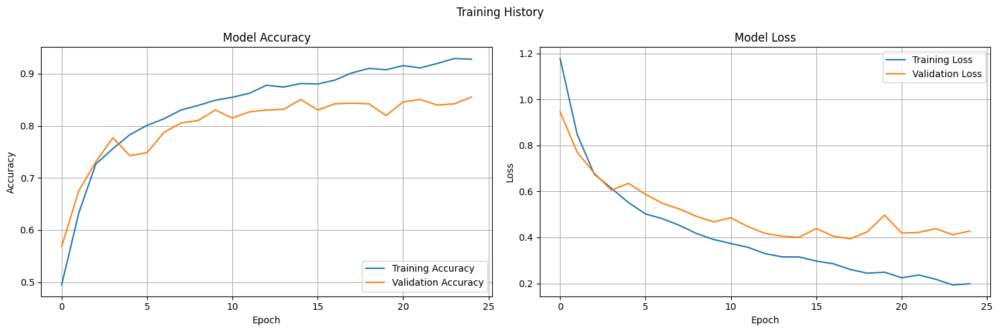

In [ ]:
# Plot training history showing accuracy and loss curves
fig, axes = plt.subplots(1, 2, figsize=(15, 5))

# Accuracy plot
axes[0].plot(history.history['accuracy'], label='Training Accuracy')
axes[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
axes[0].set_title('Model Accuracy')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend(loc='lower right')
axes[0].grid(True)

# Loss plot
axes[1].plot(history.history['loss'], label='Training Loss')
axes[1].plot(history.history['val_loss'], label='Validation Loss')
axes[1].set_title('Model Loss')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend(loc='upper right')
axes[1].grid(True)

fig.suptitle('Training History')
fig.tight_layout()
plt.show()

In [ ]:
# Directory of source and destination
src = '/content/tensorboard/finalModel'
dst = '/content/drive/MyDrive/S3_Glaucoma/tensorboard/finalModel'

safe_copy_folder(src, dst, dirs_exist=True)

Folder copied successfully: /content/drive/MyDrive/S3_Glaucoma/tensorboard/finalModel


In [ ]:
# Directory of source and destination
src = '/content/model'
dst = '/content/drive/MyDrive/S3_Glaucoma/model'

safe_copy_folder(src, dst, dirs_exist=True)

Folder copied successfully: /content/drive/MyDrive/S3_Glaucoma/model


In [ ]:
%tensorboard --logdir /content/tensorboard

<IPython.core.display.Javascript object>

### Evaluation

In [ ]:
# src = '/content/drive/MyDrive/S3_Glaucoma/model/FinalModel.keras'
# dst = '/content/model'

# safe_copy_file(src, dst)

In [ ]:
model_path = '/content/model/FinalModel.keras'

# Load the model
try:
    model = tf.keras.models.load_model(model_path)
    print(f"Model successfully loaded from: {model_path}")

    model.summary()

except Exception as e:
    print(f"Error loading the model: {e}")

Model successfully loaded from: /content/model/FinalModel.keras


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 222, 222, 8)    │           224 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 111, 111, 8)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 109, 109, 16)   │         1,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 54, 54, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 52, 52, 32)     │         4,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 26, 26, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 26, 26, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 21632)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 10)             │       216,330 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │            44 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 667,220 (2.55 MB)

 Trainable params: 222,406 (868.77 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 444,814 (1.70 MB)

In [ ]:
# Store batch-wise predictions and labels
all_preds = []
all_labels = []

for images, labels in val_ds:
    preds = model.predict(images, verbose=0)
    all_preds.append(preds)
    all_labels.append(labels)

# Stack all batches together
predicted_classes = np.argmax(np.vstack(all_preds), axis=1)
true_classes = np.argmax(np.vstack([label.numpy() for label in all_labels]), axis=1)

In [ ]:
from collections import Counter
print("True label distribution:", Counter(true_classes))
print("Predicted label distribution:", Counter(predicted_classes))

True label distribution: Counter({np.int64(3): 222, np.int64(1): 214, np.int64(2): 205, np.int64(0): 202})
Predicted label distribution: Counter({np.int64(3): 244, np.int64(1): 217, np.int64(0): 197, np.int64(2): 185})


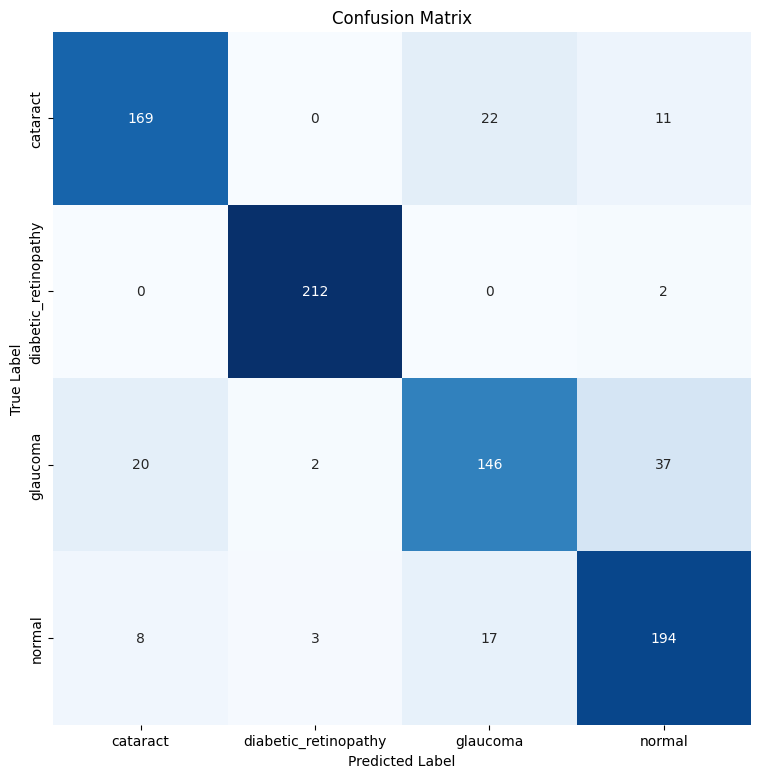

In [ ]:
# Compute  confusion matrix
conf_matrix = confusion_matrix(true_classes, predicted_classes)
plt.figure(figsize=(9, 9))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap='Blues', cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")

# Mapping of indices to class names in class_mappings
plt.xticks(ticks=np.arange(num_classes) + 0.5, labels=class_names, ha='center')
plt.yticks(ticks=np.arange(num_classes) + 0.5, labels=class_names, va='center')
plt.show()

In [ ]:
# Compute overall metrics
accuracy = accuracy_score(true_classes, predicted_classes)
precision_weighted = precision_score(true_classes, predicted_classes, average='weighted')
recall_weighted = recall_score(true_classes, predicted_classes, average='weighted')
f1_weighted = f1_score(true_classes, predicted_classes, average='weighted')

# Compute class-wise metrics
# accuracy_per_class = accuracy_score(true_classes, predicted_classes)
precision_per_class = precision_score(true_classes, predicted_classes, average=None)
recall_per_class = recall_score(true_classes, predicted_classes, average=None)
f1_per_class = f1_score(true_classes, predicted_classes, average=None)

# Display results
print(f"\033[92mOverall Accuracy: {accuracy:.4f}\033[0m")
print(f"Weighted Precision: {precision_weighted:.4f}")
print(f"Weighted Recall: {recall_weighted:.4f}")
print(f"Weighted F1-Score: {f1_weighted:.4f}\n")

print("Class-wise metrics:")
for i, class_name in enumerate(class_names):
    print(f"\033[94mClass: {class_name}\033[0m")
    # print(f"Accuracy: {accuracy_per_class:.4f}")
    print(f"Precision: {precision_per_class[i]:.4f}")
    print(f"Recall: {recall_per_class[i]:.4f}")
    print(f"F1-Score: {f1_per_class[i]:.4f}\n")

Overall Accuracy: 0.8553
Weighted Precision: 0.8549
Weighted Recall: 0.8553
Weighted F1-Score: 0.8541

Class-wise metrics:
Class: cataract
Precision: 0.8579
Recall: 0.8366
F1-Score: 0.8471

Class: diabetic_retinopathy
Precision: 0.9770
Recall: 0.9907
F1-Score: 0.9838

Class: glaucoma
Precision: 0.7892
Recall: 0.7122
F1-Score: 0.7487

Class: normal
Precision: 0.7951
Recall: 0.8739
F1-Score: 0.8326

